In [3]:
import scanpy as sc
import anndata as ad
import skimage
import numpy as np
import leidenalg
import mygene
import pandas as pd
import matplotlib.pyplot as plt
import celltypist
from celltypist import models

In [4]:
adata = sc.read_h5ad('zebrafish_endothelium.h5ad')

In [5]:
print(adata)

AnnData object with n_obs × n_vars = 27484 × 32031
    obs: 'Size_Factor', 'n.umi', 'perc_mitochondrial_umis', 'hash_umis', 'log.n.umi', 'top_to_second_best_ratio', 'projection_group', 'cell_type_long', 'cell_type_broad', 'num_genes_expressed', 'embryo_ID', 'perturbation', 'target', 'type', 'strain', 'expt', 'cross_batch', 'collection_batch', 'dis_protocol', 'fix_protocol', 'timepoint', 'cold_delay', 'subumap3d_1', 'subumap3d_2', 'subumap3d_3', 'mean_nn_time', 'cells_per_embryo', 'cell_type_ontology_term_id', 'donor_id', 'tissue_type', 'cell_line_ontology_term_id', 'perturbation_strategy', 'perturbation_role', 'perturbation_target_gene_id', 'perturbation_id', 'is_primary_data', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'assay_ontology_term_id', 'suspension_type', 'cell_type_short', 'publication', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicit

In [6]:
print(adata.var)

                   gene_short_name chromosome       bp1       bp2 gene_strand  \
id                                                                              
ENSDARG00000000001         slc35a5          9  34111567  34121839           -   
ENSDARG00000000002          ccdc80          9  34089156  34113709           +   
ENSDARG00000000018            nrf1          4  15080885  15103696           -   
ENSDARG00000000019           ube2h          4  15011341  15060376           +   
ENSDARG00000000068       slc9a3r1a         12  33484458  33537626           +   
...                            ...        ...       ...       ...         ...   
ENSDARG00000117823      BX537296.5          6  20202009  20360733           -   
ENSDARG00000117824  CABZ01064670.1         10     32401     45486           -   
ENSDARG00000117825      CU207269.4         21  45445457  45447799           +   
ENSDARG00000117826      CR385041.2          6  34487776  34510636           +   
ENSDARG00000117827      CR38

In [7]:
# Mitochondrial genes start with 'mt-'
adata.var['mt'] = adata.var['gene_short_name'].str.startswith('mt-')

# Ribosomal genes start with 'rps' or 'rpl'
adata.var['ribo'] = adata.var['gene_short_name'].str.startswith(('rps', 'rpl'))

# Hemoglobin genes start with 'hba' or 'hbb'
adata.var['hb'] = adata.var['gene_short_name'].str.startswith(('hba', 'hbb'))

# Combine into one categorical column
conditions = [adata.var['mt'], adata.var['ribo'], adata.var['hb']]
choices = ['mitochondrial', 'ribosomal', 'hemoglobin']

adata.var['gene_group'] = np.select(conditions, choices, default='other')


In [8]:

sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=['mt', 'ribo', 'hb'],
    inplace=True,
    log1p=True  # optional, adds log1p transformed metrics
)


... storing 'gene_group' as categorical


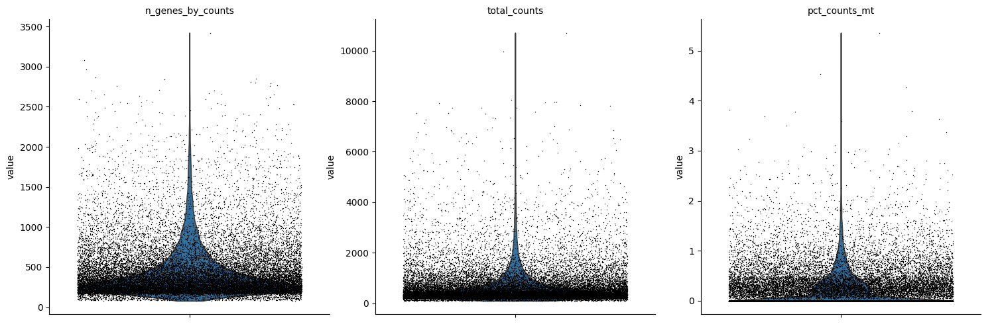

In [9]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

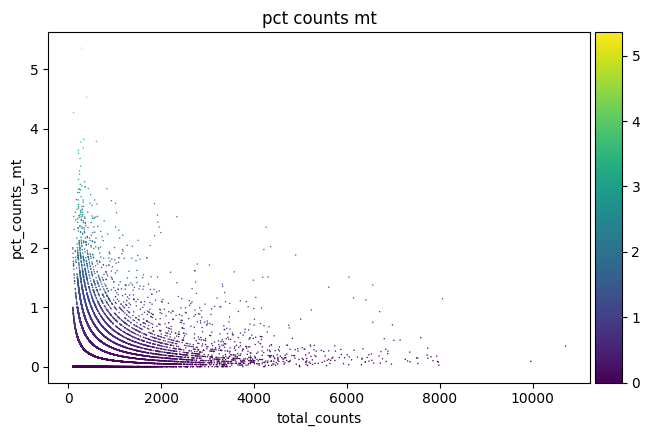

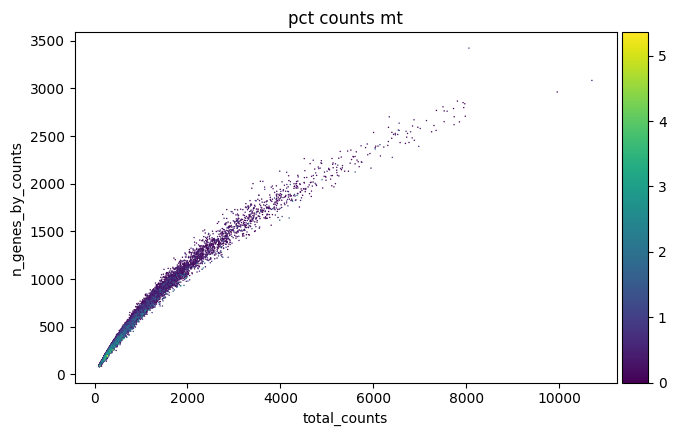

In [10]:
sc.pl.scatter(adata, "total_counts",
              "pct_counts_mt", color="pct_counts_mt")
sc.pl.scatter(adata, "total_counts",
              "n_genes_by_counts", color="pct_counts_mt")

axes: [<Axes: > <Axes: >]


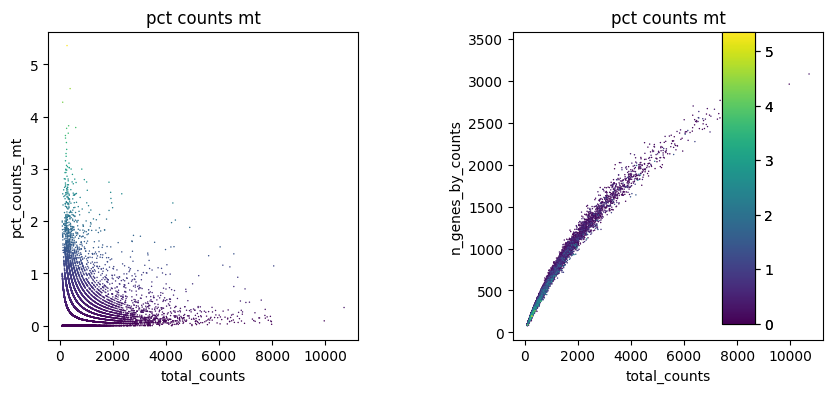

In [11]:
# Define matplotlib Axes
# Number of Axes & plot size
ncols = 2
nrows = 1
figsize = 4
wspace = 0.5
fig, axs = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(ncols * figsize + figsize * wspace * (ncols - 1),
             nrows * figsize),
)
plt.subplots_adjust(wspace=wspace)
# This produces two Axes objects in a single Figure
print("axes:", axs)

# We can use these Axes objects individually to plot them
# We need to set show=False so that Figure is not displayed before we
# finished plotting on all Axes and making all plot adjustments
sc.pl.scatter(adata, "total_counts", "pct_counts_mt", color="pct_counts_mt", ax=axs[0], show=False)
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt", ax=axs[1])

In [12]:
sc.pp.scrublet(adata)

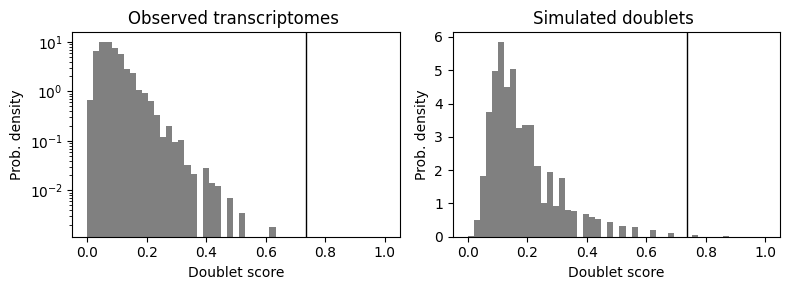

In [13]:
sc.pl.scrublet_score_distribution(adata)

In [14]:
adata.obs

,Size_Factor,n.umi,perc_mitochondrial_umis,hash_umis,log.n.umi,top_to_second_best_ratio,projection_group,cell_type_long,cell_type_broad,num_genes_expressed,...,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,doublet_score,predicted_doublet
cell,,,,,,,,,,,,,,,,,,,,,
D04_C05_P04-H09_LIG62_GAP16,0.483712,238,2.521008,14,2.376577,7.086455,endothelium,"cardiac endothelial cell, endocardium",endocardium,NaN,...,0.000000,0.000000,2.0,1.098612,0.840336,0.0,0.0,0.0,0.152613,False
A06_D11_P03-A04_LIG50_GAP16,2.089309,1028,1.167315,63,3.011993,9.905072,endothelium,"endothelial cell, lymph vesel endothelium",endothelium,NaN,...,0.693147,0.097276,6.0,1.945910,0.583658,0.0,0.0,0.0,0.053254,False
C04_C08_P01-E07_LIG20_GAP16,0.686952,338,2.366864,36,2.528917,18.121917,endothelium,"endothelial cell, lymph vesel endothelium",endothelium,NaN,...,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.033147,False
G02_B07_P04-F09_LIG373_GAP16,0.825155,406,1.477833,16,2.608526,5.495596,endothelium,"endothelial cell, lymph vesel endothelium",endothelium,NaN,...,0.000000,0.000000,3.0,1.386294,0.738916,0.0,0.0,0.0,0.038835,False
H06_C07_P04-C12_LIG119_GAP13,2.166541,1066,0.844278,79,3.027757,4.969569,endothelium,"endothelial cell, lymph vesel endothelium",endothelium,NaN,...,0.000000,0.000000,4.0,1.609438,0.375235,0.0,0.0,0.0,0.082203,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F04_F11_P01-C05_LIG381_CHEM1,0.662563,326,3.374233,44,2.513218,5.766626,endothelium,"endothelial cell, blood vessel endothelium",endothelium,NaN,...,0.000000,0.000000,2.0,1.098612,0.613497,0.0,0.0,0.0,0.143804,False
F02_B07_P01-H03_LIG58_GAP16,1.001974,493,0.608519,29,2.692847,25.247563,endothelium,"endothelial cell, blood vessel endothelium",endothelium,NaN,...,0.693147,0.202840,0.0,0.000000,0.000000,0.0,0.0,0.0,0.080517,False
E05_D05_P01-C09_LIG16_CHEM3,0.599559,295,0.000000,11,2.469822,inf,endothelium,"endothelial cell, blood vessel endothelium",endothelium,NaN,...,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.110165,False


In [15]:
adata.layers["counts"] = adata.X.copy()

In [16]:
sc.pp.normalize_total(adata)

In [17]:
sc.pp.log1p(adata)

In [18]:
sc.pp.highly_variable_genes(adata, n_top_genes=5000)

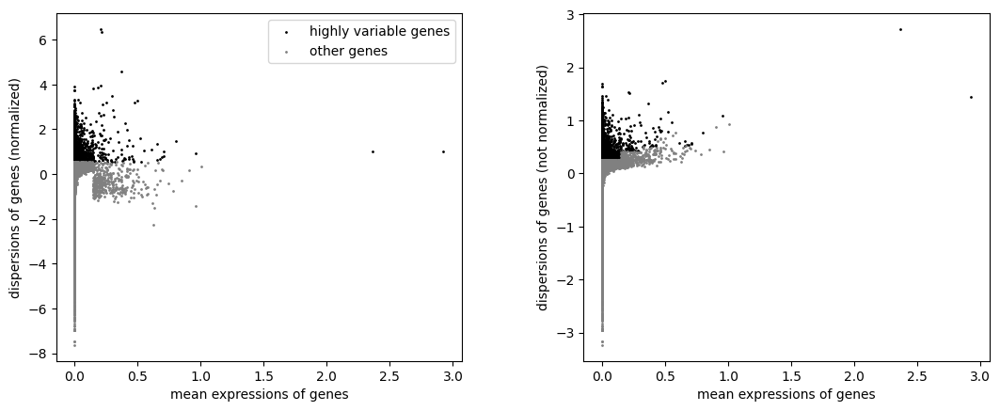

In [19]:
sc.pl.highly_variable_genes(adata)

In [20]:
sc.tl.pca(adata)

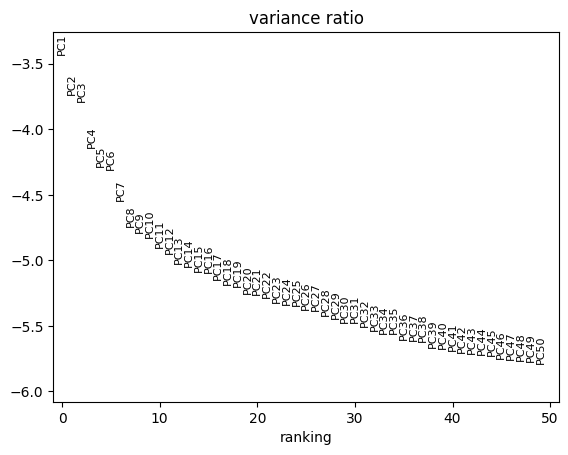

In [21]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

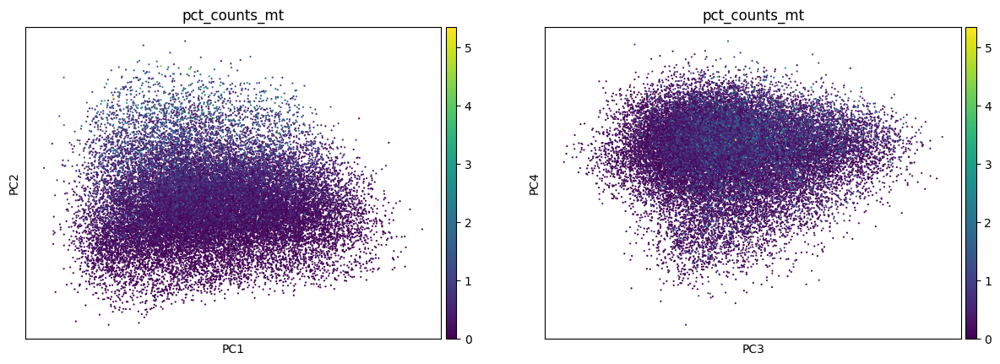

In [22]:
sc.pl.pca(
    adata,
    color=["pct_counts_mt"],
    dimensions=[(0, 1),(2, 3)],
    ncols=2,
    size=10,
)

In [23]:
sc.pp.neighbors(adata)

In [24]:
sc.tl.umap(adata)

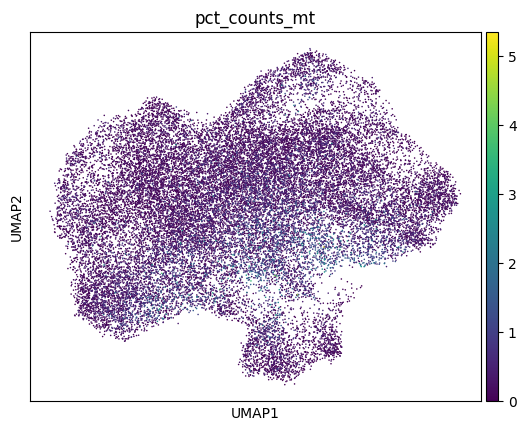

In [25]:
sc.pl.umap(
    adata,
    color="pct_counts_mt",
    size=5,
)

In [26]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)  # adjust parameters as you want

In [27]:
sc.tl.leiden(adata, flavor="leidenalg", n_iterations=2)

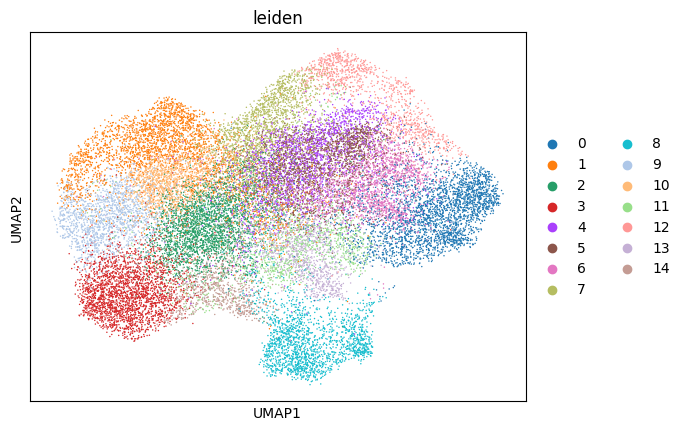

In [28]:
sc.pl.umap(adata, color=["leiden"])

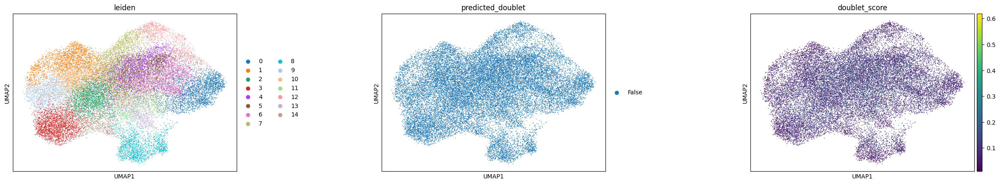

In [29]:
sc.pl.umap(
    adata,
    color=["leiden", "predicted_doublet", "doublet_score"],
    wspace=0.5,
    size=5,
)

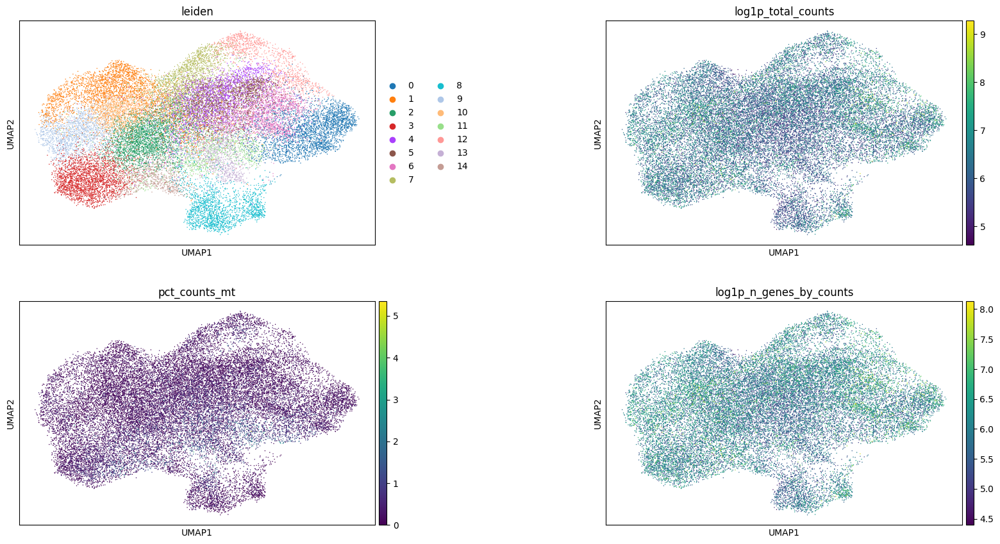

In [30]:
sc.pl.umap(
    adata,
    color=["leiden", "log1p_total_counts", "pct_counts_mt",
           "log1p_n_genes_by_counts"],
    wspace=0.5,
    ncols=2,
)

In [31]:
for res in [0.02, 0.5, 2.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}",
        resolution=res, flavor="leidenalg"
    )

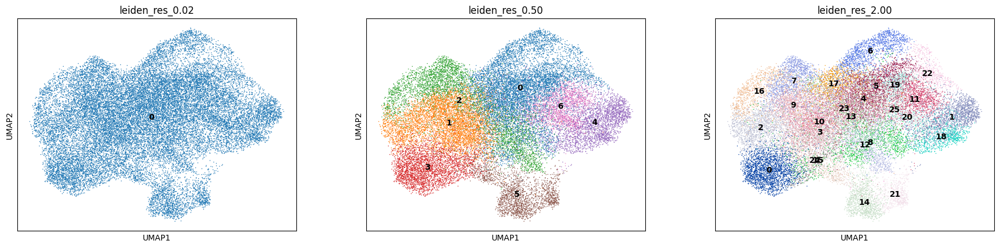

In [32]:
sc.pl.umap(
    adata,
    color=["leiden_res_0.02",
           "leiden_res_0.50",
           "leiden_res_2.00"],
    legend_loc="on data",
)

In [33]:
print(adata.var_names[:20])

Index(['ENSDARG00000000001', 'ENSDARG00000000002', 'ENSDARG00000000018',
       'ENSDARG00000000019', 'ENSDARG00000000068', 'ENSDARG00000000069',
       'ENSDARG00000000086', 'ENSDARG00000000103', 'ENSDARG00000000142',
       'ENSDARG00000000151', 'ENSDARG00000000161', 'ENSDARG00000000175',
       'ENSDARG00000000183', 'ENSDARG00000000189', 'ENSDARG00000000212',
       'ENSDARG00000000229', 'ENSDARG00000000241', 'ENSDARG00000000324',
       'ENSDARG00000000349', 'ENSDARG00000000369'],
      dtype='object', name='id')


In [34]:
print(adata.var.head())


                   gene_short_name chromosome       bp1       bp2 gene_strand  \
id                                                                              
ENSDARG00000000001         slc35a5          9  34111567  34121839           -   
ENSDARG00000000002          ccdc80          9  34089156  34113709           +   
ENSDARG00000000018            nrf1          4  15080885  15103696           -   
ENSDARG00000000019           ube2h          4  15011341  15060376           +   
ENSDARG00000000068       slc9a3r1a         12  33484458  33537626           +   

                   num_cells_expressed  feature_is_filtered feature_name  \
id                                                                         
ENSDARG00000000001                conf                False      slc35a5   
ENSDARG00000000002                conf                False       ccdc80   
ENSDARG00000000018                conf                False         nrf1   
ENSDARG00000000019                conf              

In [35]:
# Define the mapping dictionary
symbol_to_ensembl = {
    "elavl3": "ENSDARG00000005793",
    "syn1": "ENSDARG00000016427",
    "map2": "ENSDARG00000002232",
    "myod1": "ENSDARG00000006810",
    "myf5": "ENSDARG00000037740",
    "acta1b": "ENSDARG00000021784",
    "kdrl": "ENSDARG00000003176",
    "flt1": "ENSDARG00000011910",
    "cdh5": "ENSDARG00000031518",
    "runx1": "ENSDARG00000052377",
    "cd34": "ENSDARG00000001461",
    "cmyb": "ENSDARG00000034820",
    "mpeg1.1": "ENSDARG00000047254",
    "csf1ra": "ENSDARG00000007621",
    "lyz": "ENSDARG00000005054",
    "gata1a": "ENSDARG00000032640",
    "hbae3": "ENSDARG00000048594",
    "hbbe1.1": "ENSDARG00000054691",
}

# Example marker genes by cell type
marker_genes_symbols = {
    "Neurons": ["elavl3", "syn1", "map2"],
    "Muscle cells": ["myod1", "myf5", "acta1b"],
    "Endothelial cells": ["kdrl", "flt1", "cdh5"],
    "Hematopoietic stem cells": ["runx1", "cd34", "cmyb"],
    "Macrophages": ["mpeg1.1", "csf1ra", "lyz"],
    "Erythrocytes": ["gata1a", "hbae3", "hbbe1.1"],
}

# Convert gene symbols to Ensembl Gene IDs
marker_genes_ensembl = {
    cell_type: [symbol_to_ensembl.get(gene, gene) for gene in genes]
    for cell_type, genes in marker_genes_symbols.items()
}

# Display the mapping
for cell_type, genes in marker_genes_ensembl.items():
    print(f"{cell_type}: {genes}")


Neurons: ['ENSDARG00000005793', 'ENSDARG00000016427', 'ENSDARG00000002232']
Muscle cells: ['ENSDARG00000006810', 'ENSDARG00000037740', 'ENSDARG00000021784']
Endothelial cells: ['ENSDARG00000003176', 'ENSDARG00000011910', 'ENSDARG00000031518']
Hematopoietic stem cells: ['ENSDARG00000052377', 'ENSDARG00000001461', 'ENSDARG00000034820']
Macrophages: ['ENSDARG00000047254', 'ENSDARG00000007621', 'ENSDARG00000005054']
Erythrocytes: ['ENSDARG00000032640', 'ENSDARG00000048594', 'ENSDARG00000054691']


In [36]:
marker_genes_ensembl = {
    cell_type: [symbol_to_ensembl.get(gene, gene) for gene in genes]
    for cell_type, genes in marker_genes_symbols.items()
}


In [37]:
all_genes = [gene for genes in marker_genes_symbols.values() for gene in genes]
missing_genes = [gene for gene in all_genes if gene not in symbol_to_ensembl]
print("Missing genes:", missing_genes)


Missing genes: []


In [38]:
print(adata.obs.columns)

Index(['Size_Factor', 'n.umi', 'perc_mitochondrial_umis', 'hash_umis',
       'log.n.umi', 'top_to_second_best_ratio', 'projection_group',
       'cell_type_long', 'cell_type_broad', 'num_genes_expressed', 'embryo_ID',
       'perturbation', 'target', 'type', 'strain', 'expt', 'cross_batch',
       'collection_batch', 'dis_protocol', 'fix_protocol', 'timepoint',
       'cold_delay', 'subumap3d_1', 'subumap3d_2', 'subumap3d_3',
       'mean_nn_time', 'cells_per_embryo', 'cell_type_ontology_term_id',
       'donor_id', 'tissue_type', 'cell_line_ontology_term_id',
       'perturbation_strategy', 'perturbation_role',
       'perturbation_target_gene_id', 'perturbation_id', 'is_primary_data',
       'development_stage_ontology_term_id', 'sex_ontology_term_id',
       'self_reported_ethnicity_ontology_term_id', 'disease_ontology_term_id',
       'tissue_ontology_term_id', 'assay_ontology_term_id', 'suspension_type',
       'cell_type_short', 'publication', 'cell_type', 'assay', 'disease',
  

In [39]:
markers = [gene for genes in marker_genes_ensembl.values() for gene in genes]
missing = [g for g in markers if g not in adata.var_names]
print("Missing markers:", missing)


Missing markers: ['ENSDARG00000005793', 'ENSDARG00000002232', 'ENSDARG00000006810', 'ENSDARG00000037740', 'ENSDARG00000021784', 'ENSDARG00000003176', 'ENSDARG00000011910', 'ENSDARG00000031518', 'ENSDARG00000001461', 'ENSDARG00000034820', 'ENSDARG00000047254', 'ENSDARG00000007621', 'ENSDARG00000005054', 'ENSDARG00000032640', 'ENSDARG00000048594', 'ENSDARG00000054691']


In [41]:
sc.tl.rank_genes_groups(adata, groupby="leiden_res_0.50", method='t-test') 

In [42]:
marker_results = adata.uns['rank_genes_groups']


In [43]:
marker_results = adata.uns['rank_genes_groups']

groups = marker_results['names'].dtype.names  # cluster names
filtered_marker_genes = []

for group in groups:
    # Create a DataFrame of the marker results for this group
    df = pd.DataFrame({
        'names': marker_results['names'][group],
        'logfoldchanges': marker_results['logfoldchanges'][group],
        'pvals_adj': marker_results['pvals_adj'][group]
    })

    # Current filtering might be strict, e.g.:
    # filtered_genes = df[(df['pvals_adj'] < 0.01) & (df['logfoldchanges'] > 1)]['names']

    # To relax, try:
    filtered_genes = df[(df['pvals_adj'] < 0.05) & (df['logfoldchanges'] > 0.25)]['names']

    filtered_marker_genes.extend(filtered_genes.tolist())

# Remove duplicates
filtered_marker_genes = list(set(filtered_marker_genes))


In [45]:
sc.pl.dotplot(adata, filtered_marker_genes, groupby="leiden_res_0.50", standard_scale="var")

In [46]:
print(f"Number of filtered marker genes: {len(filtered_marker_genes)}")
print(filtered_marker_genes[:10])  # Show first 10 genes


Number of filtered marker genes: 5955
['ENSDARG00000040614', 'ENSDARG00000029621', 'ENSDARG00000095034', 'ENSDARG00000040295', 'ENSDARG00000077948', 'ENSDARG00000038822', 'ENSDARG00000010610', 'ENSDARG00000018508', 'ENSDARG00000023188', 'ENSDARG00000077722']


In [48]:
filtered_marker_genes_in_adata = [g for g in filtered_marker_genes if g in adata.var_names]

print(f"Number of filtered marker genes in adata: {len(filtered_marker_genes_in_adata)}")

sc.pl.dotplot(adata, filtered_marker_genes_in_adata, groupby="leiden_res_0.50", standard_scale="var")


Number of filtered marker genes in adata: 5955


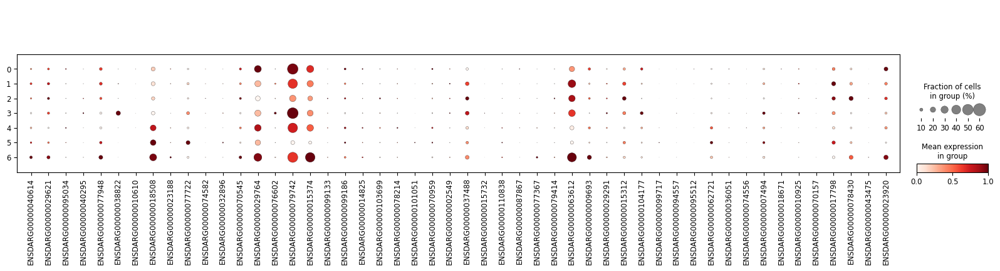

In [51]:
# For example, take top 30
sc.pl.dotplot(
    adata,
    filtered_marker_genes[:50],
    groupby="leiden_res_0.50",
    standard_scale="var"
)


In [52]:
sc.tl.rank_genes_groups(adata,
                        groupby="leiden_res_0.50", method="wilcoxon")

dendrogram data not found (using key=dendrogram_leiden_res_0.50). Running `sc.tl.dendrogram` with default parameters. For fine tuning it is recommended to run `sc.tl.dendrogram` independently.


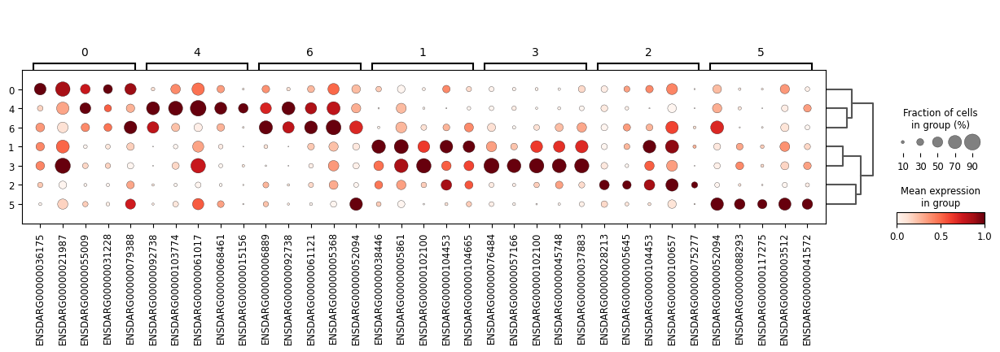

In [53]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res_0.50",
    standard_scale="var", n_genes=5
)